# This notebook shows how to design synthetic sequences by using in silico evolution for Glial Cells.
#### It uses the selected enhancers from the FLY_KC_EFS notebook
#### It consists of:
* Performing in silico evolution experiments.
* Plotting the findings.
* Printing generated DNA sequences in nucleotide letters.
#### Intermediate files are saved to ./data/deepflybrain folder
#### Figures are saved to ./figures/evolution_from_scratch_PNG


### General imports


In [1]:
import sys  
import os
import pickle
import utils
import numpy as np
import scipy
import tensorflow as tf
tf.disable_eager_execution()
tf.logging.set_verbosity(tf.logging.ERROR)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use("default")
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

### Loading DeepFlyBrain data to be used for the initialization of shap.DeepExplainer


In [2]:
print('Loading data...')
f = open('./data/deepflybrain/DeepFlyBrain_nonAugmented_data.pkl', "rb")
nonAugmented_data_dict = pickle.load(f)
f.close()

Loading data...


### Loading the model and initializing shap.DeepExplainer


In [3]:
print('Loading model...')
import shap
tf.disable_eager_execution()
rn=np.random.choice(nonAugmented_data_dict["train_data"].shape[0], 250, replace=False)
model_dict = {}
exp_dict = {} 

name = "DeepFlyBrain"
model_json_file = "models/deepflybrain/model.json"
model_hdf5_file = "models/deepflybrain/model_epoch_83.hdf5"
model_dict[name] = utils.load_model(model_json_file, model_hdf5_file)
exp_dict[name] = shap.DeepExplainer((model_dict[name].inputs, model_dict[name].layers[-1].output), nonAugmented_data_dict["train_data"][rn])


Loading model...


In [4]:
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

#### This code:
* Takes genomic regions fasta file and creates GC adjusted random sequences
* Performs in silico evolution on random sequences

In [5]:
# import pickle
# f = open("data/deepflybrain/FLY_KC_EFS_6000_withmut.pkl", "rb")
# KC_evolved_seq_6000_dict = pickle.load(f)
# f.close()

# evolved_seq_500_dict = {}
# evolved_seq_500_dict["X"] = KC_evolved_seq_6000_dict['X'][:500]

# path_to_save = "data/deepflybrain/FLY_PNG_EFS_500_withmut.pkl"

# evolved_seq_500_dict["mut_pred"], \
# evolved_seq_500_dict["mut_loc"] = utils.insilico_evolution(regions = evolved_seq_500_dict["X"],
#                                                                 model = model_dict["DeepFlyBrain"],
#                                                                 class_no = 34,
#                                                                 n_mutation = 20,
#                                                                 rc = False
#                                                                )
# # save the final file
# import pickle
# f = open(path_to_save, "wb")
# pickle.dump(evolved_seq_500_dict,f)
# f.close()


In [6]:
import pickle
f = open("data/deepflybrain/FLY_PNG_EFS_500_withmut.pkl", "rb")
PNG_evolved_seq_500_dict = pickle.load(f)
f.close()

In [7]:
import pickle
f = open("data/deepflybrain/FLY_KC_EFS_6000_withmut.pkl", "rb")
KC_evolved_seq_6000_dict = pickle.load(f)
f.close()

### Printing generated DNA sequences in nucleotide letters.

In [11]:
# PNG 15 mut
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
for id_ in [1,35,59,91,135,148]:     
    start_x = np.copy(PNG_evolved_seq_500_dict["X"][id_:id_+1])
    print("id:",id_)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        print(mut_,end=",")
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    print("") 
    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")



id: 1
170_A,333_G,344_A,272_G,274_T,265_A,192_A,174_A,159_A,161_C,183_T,120_C,186_A,185_A,198_T,
GATACACCGGTCACCGCCAGGGGAGTCGAAGAGAATTCGCTTGGAGGATCTCACTTTGCAATCGTTAGAAGGTTCAACGAAGCCTATAACAACATGAGAAATTGCCATAAAAATGGCCTACGTTACTCTGGCCCTAGTCAATTAAAGGCGAGTCACGTGATCAATTGCCAATTGACCCCGACGTCAATGAATACGTCATAGCGGGCACACATTCCAACTCAGAGTGTTCTTATGTCTGGGGGTCGTGACCGCTCCTCACCTCGTCAGCGATCGATAGGCTAGGCCCTGCCCAGTCACTATTTCGGAGGTCTCGGCTAGCCCCTAACAGTGATCGCGTTTCGACGATCGCTCTATTACACTAGCAAAAAGAGCATTTTTACAAAAGTTTAGAGAAAAGTCCCAACCTGTTAAGAAATTAAGGCCTGAAGCTGATTTGGTAGACCGTATTAATACACTCAAGACTCTGAGGGGGTTTCATTAGTGAGGGATACCCCCTTTAT
id: 35
242_T,169_T,248_G,259_A,244_G,229_T,224_A,220_A,153_C,157_T,216_C,102_C,230_C,138_T,147_T,
AATGGTTCCACATTACAGTTACCATACCGAGGAACTGAACAGATAATTACTTCATCAATCGAACCCTTACATCAGGTCTAGACAAATGTCAGGGGGTGTCGCCAATTGCCGTTTATAGTCAGTATTTCATATAGCCAATGACATAAATGAAGTCAATTGTGGGAGCCAATGACGCCATTAAGGGGGGCCCTGCTAGCAGTACCCGGCCCGCGTTGTCGTAAGCAATCAATCAGAGGCGGCAATTGATTGTCGAAGAATCAATGTGCCCAGCCTGACTGACAAGGCATACGTGTTCTGCGTTCCC

### Plotting prediction scores at each mutational step for selected regions

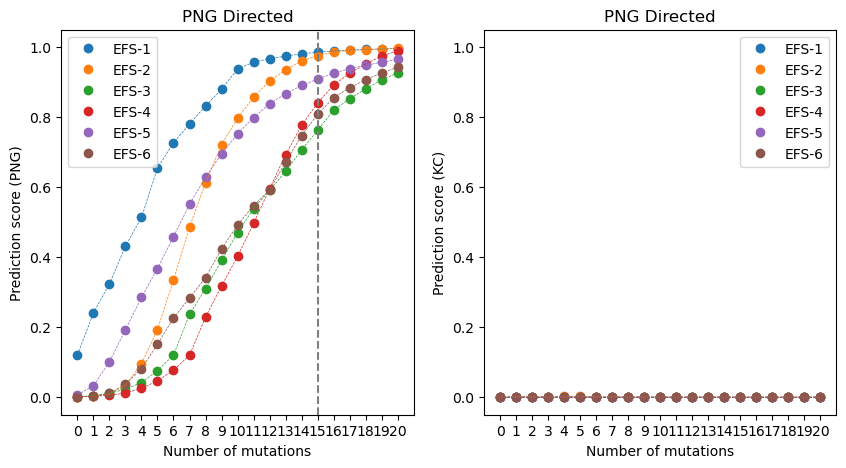

In [25]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1,2,1)
topic=33
ids__ = [1,35,59,91,135,148]
for k,i in enumerate(ids__):
    _ = plt.plot(PNG_evolved_seq_500_dict["mut_pred"][i,:21,topic].T,label="EFS-"+str(k+1),linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,i in enumerate(ids__):
    _ = plt.plot(PNG_evolved_seq_500_dict["mut_pred"][i,:21,topic].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(21),list(range(21)))
plt.axvline(x=15,linestyle="--",color="gray")
ax.set_ylim(-0.05,1.05)
plt.title("PNG Directed")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score (PNG)")

ax = fig.add_subplot(1,2,2)
topic=34
ids__ = [1,35,59,91,135,148]
for k,i in enumerate(ids__):
    _ = plt.plot(PNG_evolved_seq_500_dict["mut_pred"][i,:21,topic].T,label="EFS-"+str(k+1),linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,i in enumerate(ids__):
    _ = plt.plot(PNG_evolved_seq_500_dict["mut_pred"][i,:21,topic].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(21),list(range(21)))
ax.set_ylim(-0.05,1.05)
plt.title("PNG Directed")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score (KC)")

plt.savefig("figures/evolution_from_scratch/PNG_EFS_SelectedSeqs_Prediction.pdf",transparent=True)

### Plotting contribution scores of random and fully evolved sequences for both KC and PNG.

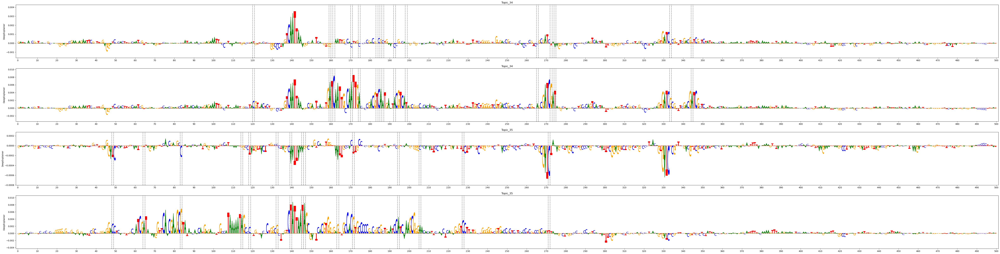

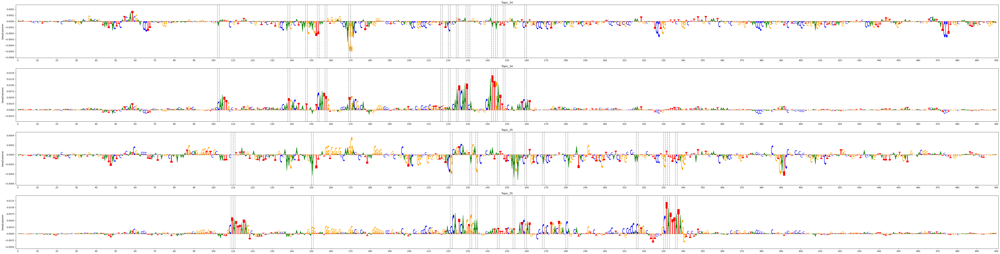

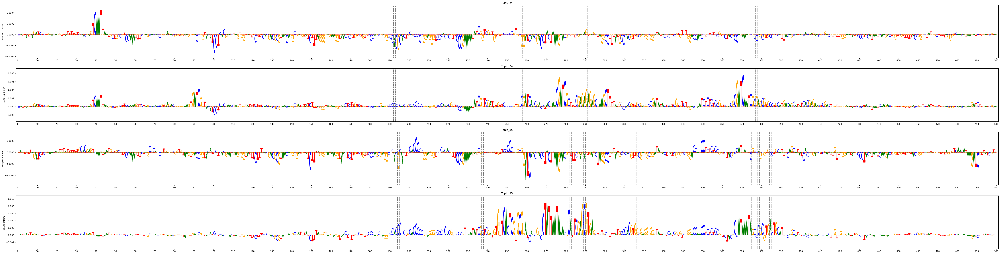

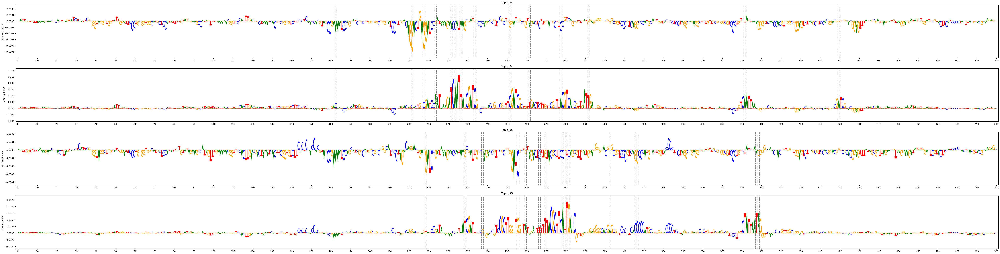

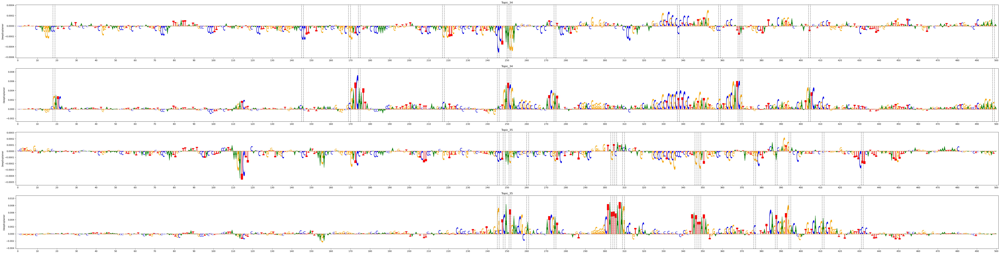

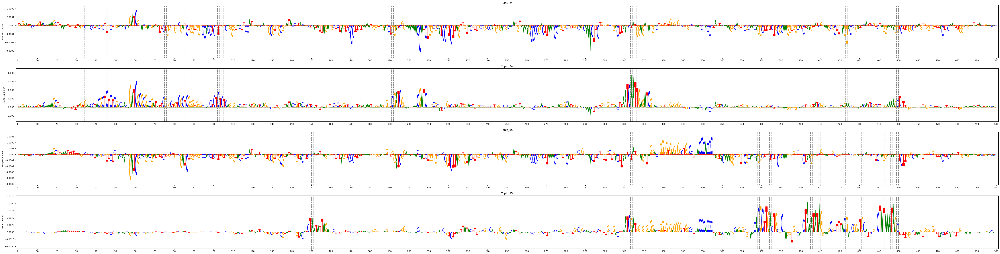

In [26]:
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
for enh_, id_ in enumerate([1,35,59,91,135,148]):  
    st = 0
    end = 500
    ntrack = 4
    fig = plt.figure(figsize=(80,ntrack*5))
    
    start_x = np.copy(PNG_evolved_seq_500_dict["X"][id_:id_+1])
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=1, seq_onehot=start_x, class_no = 34)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=2, seq_onehot=start_x, class_no = 34)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")



    start_x = np.copy(KC_evolved_seq_6000_dict["X"][id_:id_+1])
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=3, seq_onehot=start_x, class_no = 35)
    for i, mut_ in enumerate(KC_evolved_seq_6000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=4, seq_onehot=start_x, class_no = 35)
    for i, mut_ in enumerate(KC_evolved_seq_6000_dict["mut_loc"][id_][:15]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        
    plt.savefig("figures/evolution_from_scratch_PNG/PNG_EFS_"+str(enh_+1)+".pdf",transparent=True)

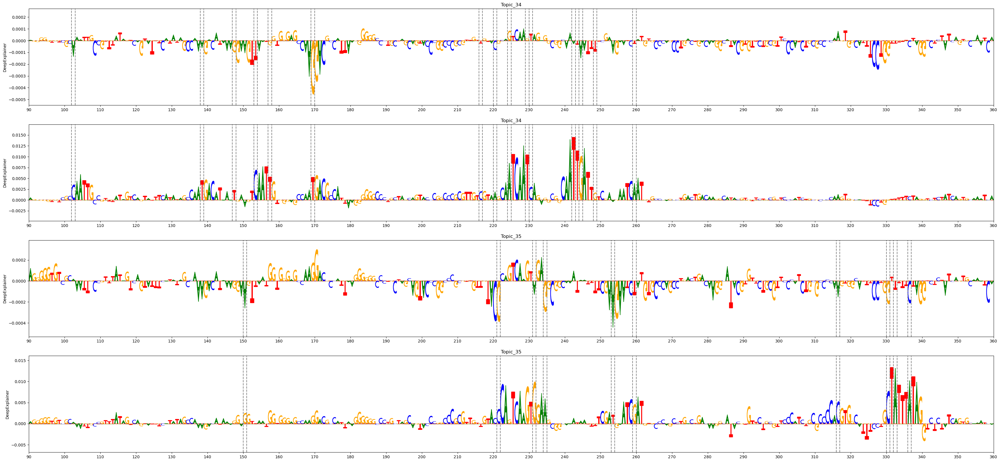

In [10]:
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
for enh_, id_ in enumerate([35]):  
    st = 90
    end = 360
    ntrack = 4
    fig = plt.figure(figsize=(43.2,ntrack*5))
    
    start_x = np.copy(PNG_evolved_seq_500_dict["X"][id_:id_+1])
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=1, seq_onehot=start_x, class_no = 34)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=2, seq_onehot=start_x, class_no = 34)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")

    ax1.set_xlim([st,end])
    ax2.set_xlim([st,end])

    start_x = np.copy(KC_evolved_seq_6000_dict["X"][id_:id_+1])
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=3, seq_onehot=start_x, class_no = 35)
    for i, mut_ in enumerate(KC_evolved_seq_6000_dict["mut_loc"][id_][:10]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=4, seq_onehot=start_x, class_no = 35)
    for i, mut_ in enumerate(KC_evolved_seq_6000_dict["mut_loc"][id_][:10]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")

    ax1.set_xlim([st,end])
    ax2.set_xlim([st,end])
        
    plt.savefig("figures/evolution_from_scratch_PNG/PNG_EFS_"+str(enh_+1)+"st90_end360.pdf",transparent=True)

In [8]:
ntrack = 24
fig = plt.figure(figsize=(80,ntrack*5))
    
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
for enh_, id_ in enumerate([1,35,59,91,135,148]):  
    st = 0
    end = 500
    
    
    start_x = np.copy(PNG_evolved_seq_500_dict["X"][id_:id_+1])
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=enh_*4+1, seq_onehot=start_x, class_no = 34)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=enh_*4+2, seq_onehot=start_x, class_no = 34)
    for i, mut_ in enumerate(PNG_evolved_seq_500_dict["mut_loc"][id_][:15]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        
    ax1.set_title("")
    ax1.set_ylabel("")
    ax2.set_title("")
    ax2.set_ylabel("")
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])



    start_x = np.copy(KC_evolved_seq_6000_dict["X"][id_:id_+1])
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=enh_*4+3, seq_onehot=start_x, class_no = 35)
    for i, mut_ in enumerate(KC_evolved_seq_6000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=enh_*4+4, seq_onehot=start_x, class_no = 35)
    for i, mut_ in enumerate(KC_evolved_seq_6000_dict["mut_loc"][id_][:15]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
    
    ax1.set_title("")
    ax1.set_ylabel("")
    ax2.set_title("")
    ax2.set_ylabel("")
    ax1.set_xticklabels([])
        
plt.savefig("figures/evolution_from_scratch_PNG/PNG_EFS_all.pdf",transparent=True)